In [1]:
import os
os.environ ["TF_CPP_MIN_LOG_LEVEL"] = "2"
import numpy as np
import cv2
from glob import glob
from tqdm import tqdm
import imageio
from albumentations import HorizontalFlip, VerticalFlip,ElasticTransform,GridDistortion,OpticalDistortion,CoarseDropout

inputroot  = '../input/drive2004'
outputroot = '../kaggle/working'

# import shutil
# shutil.rmtree("/kaggle/working/new_data")



/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
!rm -rf ./logs/ 
!mkdir ./logs/

In [3]:
# !wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
# !unzip ngrok-stable-linux-amd64.zip

# Run tensorboard as well as Ngrox (for tunneling as non-blocking processes)
import os
import multiprocessing


pool = multiprocessing.Pool(processes = 10)
results_of_processes = [pool.apply_async(os.system, args=(cmd, ), callback = None )
                        for cmd in [
                        f"tensorboard --logdir ./logs/ --host 0.0.0.0 --port 6008 &",
                        "./ngrok http 6008 &"
                        ]]

sh: 1: ./ngrok: not found
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

TensorBoard 2.12.3 at http://0.0.0.0:6008/ (Press CTRL+C to quit)
Process ForkPoolWorker-10:
Process ForkPoolWorker-3:
Process ForkPoolWorker-8:
Process ForkPoolWorker-6:
Process ForkPoolWorker-9:
Traceback (most recent call last):
Process ForkPoolWorker-5:
Process ForkPoolWorker-2:
Process ForkPoolWorker-7:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/

In [4]:
! curl -s http://localhost:4040/api/tunnels | python3 -c \
    "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

curl: /opt/conda/lib/libcurl.so.4: no version information available (required by curl)
Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/opt/conda/lib/python3.10/json/__init__.py", line 293, in load
    return loads(fp.read(),
  File "/opt/conda/lib/python3.10/json/__init__.py", line 346, in loads
    return _default_decoder.decode(s)
  File "/opt/conda/lib/python3.10/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/opt/conda/lib/python3.10/json/decoder.py", line 355, in raw_decode
    raise JSONDecodeError("Expecting value", s, err.value) from None
json.decoder.JSONDecodeError: Expecting value: line 1 column 1 (char 0)


In [5]:
def load_data(path):
    "X = Images and Y = masks"
    train_x = sorted(glob(os.path.join(path,'DRIVE/training/images',"*.tif")))
    train_y = sorted(glob(os.path.join(path,'DRIVE/training/1st_manual',"*.gif")))
    
    test_x = sorted(glob(os.path.join(path,'DRIVE/test/images',"*.tif")))
    test_y = sorted(glob(os.path.join(path,'DRIVE/test/1st_manual',"*.gif")))
    
    return (train_x, train_y), (test_x,test_y)

def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)
        
def augment_data(images,masks,save_path, augment = True):
        H = 512
        W = 512
        
        for idx,(x,y) in tqdm (enumerate(zip(images,masks)) , total=len(images)):
            name = x.split("/")[-1].split(".")[0]
            
            x = cv2.imread(x,cv2.IMREAD_COLOR)
            y = imageio.mimread(y)[0]
            
            if augment == True:
                aug = HorizontalFlip(p = 1.0)
                augmented = aug(image =x ,mask = y)
                x1 = augmented["image"]
                y1 = augmented["mask"]
                
                aug = VerticalFlip(p = 1.0)
                augmented = aug(image =x ,mask = y)
                x2 = augmented["image"]
                y2 = augmented["mask"]
                
                aug = ElasticTransform(p = 1.0 , alpha =120,sigma = 120 *0.05 , alpha_affine =120 * 0.03)
                augmented = aug(image =x ,mask = y)
                x3 = augmented["image"]
                y3 = augmented["mask"]
                
                aug = GridDistortion(p = 1.0)
                augmented = aug(image =x ,mask = y)
                x4 = augmented["image"]
                y4 = augmented["mask"]
                
                aug = OpticalDistortion(p = 1.0 , distort_limit = 2, shift_limit = 0.5)
                augmented = aug(image =x ,mask = y)
                x5 = augmented["image"]
                y5 = augmented["mask"]
                
                X = [x,x1,x2,x3,x4,x5]
                Y = [y,y1,y2,y3,y4,y5]
            else:
                X = [x]
                Y = [y]
                
            index = 0
            for i,m in zip(X,Y):
                i = cv2.resize(i,(W,H))
                m = cv2.resize(m,(W,H))
                
                if len(X) == 1:
                    tmp_image_name = f"{name}.jpg"
                    tmp_mask_name = f"{name}.jpg"
                else:
                    tmp_image_name = f"{name}_{index}.jpg"
                    tmp_mask_name = f"{name}_{index}.jpg"
                    
                image_path = os.path.join(save_path,"image",tmp_image_name)
                mask_path = os.path.join(save_path,"mask",tmp_mask_name)
                
                cv2.imwrite(image_path , i)
                cv2.imwrite(mask_path,m)
                
                index += 1              


In [6]:
np.random.seed(42)
(train_x, train_y), (test_x,test_y) = load_data(inputroot)

print(f"Train: {len(train_x)} - {len(train_y)}")
print(f"Test: {len(test_x)} - {len(test_y)}")   

Train: 20 - 20
Test: 20 - 20


In [7]:
create_dir("new_data/train/image")
create_dir("new_data/train/mask")
create_dir("new_data/test/image")
create_dir("new_data/test/mask")
augment_data(train_x,train_y,"new_data/train",augment = True)
augment_data(test_x,test_y,"new_data/test",augment = False)

100%|██████████| 20/20 [00:00<00:00, 21.97it/s]


In [8]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model

def conv_block(inputs, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def encoder_block(inputs, num_filters):
    x = conv_block(inputs, num_filters)
    p = MaxPool2D((2, 2))(x)
    return x, p

def decoder_block(inputs, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(inputs)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_unet(input_shape):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)
    b1 = conv_block(p4, 1024)
    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)
    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)
    model = Model(inputs, outputs, name="UNET")
    return model

In [9]:
    input_shape = (512, 512, 3)
    model = build_unet(input_shape)
    model.summary()

Model: "UNET"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 512, 512, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                              

In [10]:
from sklearn.utils import shuffle
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, ReduceLROnPlateau, EarlyStopping, TensorBoard
from tensorflow.keras.optimizers import Adam
from keras.losses import BinaryCrossentropy as BCE
from tensorflow.keras.metrics import Recall, Precision , Accuracy

H = 512
W = 512

def load_data_train(path):
    x = sorted(glob(os.path.join(path, "image", "*.jpg")))
    y = sorted(glob(os.path.join(path, "mask", "*.jpg")))
    return x, y
       
def shuffling(x, y):
    x, y = shuffle(x, y, random_state=42)
    return x, y

def read_image(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_COLOR)
    # x = cv2.resize(x, (W, H))
    x = x/255.0
    x = x.astype(np.float32)
    return x

def read_mask(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  ## (512, 512)
    # x = cv2.resize(x, (W, H))
    x = x/255.0
    x = x.astype(np.float32)
    x = np.expand_dims(x, axis=-1)              ## (512, 512, 1)
    return x

def tf_parse(x, y):
    def _parse(x, y):
        x = read_image(x)
        y = read_mask(y)
        return x, y

    x, y = tf.numpy_function(_parse, [x, y], [tf.float32, tf.float32])
    x.set_shape([H, W, 3])
    y.set_shape([H, W, 1])
    return x, y

def tf_dataset(X, Y, batch_size=2):
    dataset = tf.data.Dataset.from_tensor_slices((X, Y))
    dataset = dataset.map(tf_parse)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(4)
    return dataset

In [11]:
from sklearn.model_selection import train_test_split
np.random.seed(42)
tf.random.set_seed(42)

""" Directory to save files """
create_dir("files")

""" Hyperparameters """
batch_size = 2
lr = 1e-4
num_epochs = 100
# model_path = os.path.join("files", "model.h5")
csv_path = os.path.join("files", "data.csv")
log_path = os.path.join("files", "logs")

""" Dataset """
dataset_path = "/kaggle/working/new_data"
train_path = os.path.join(dataset_path, "train")
test_path = os.path.join(dataset_path, "test")

train_x, train_y = load_data_train(train_path)
train_x, train_y = shuffling(train_x, train_y)
train_x, valid_x, train_y, valid_y = train_test_split(train_x, train_y, test_size=0.1, random_state=42)
test_x, test_y = load_data_train(test_path)

print(f"Train: {len(train_x)} - {len(train_y)}")
print(f"Valid: {len(valid_x)} - {len(valid_y)}")
print(f"Test: {len(test_x)} - {len(test_y)}")

train_dataset = tf_dataset(train_x, train_y, batch_size=batch_size)
valid_dataset = tf_dataset(valid_x, valid_y, batch_size=batch_size)

train_steps = len(train_x)//batch_size
valid_steps = len(valid_x)//batch_size

if len(train_x) % batch_size != 0:
    train_steps += 1
if len(valid_x) % batch_size != 0:
    valid_steps += 1


Train: 108 - 108
Valid: 12 - 12
Test: 20 - 20


In [12]:
from tensorflow import keras
import matplotlib.pyplot as plt
class DisplayCallback(keras.callbacks.Callback):
    def __init__(self, dataset, epoch_interval=5):
        self.dataset = dataset
        self.epoch_interval = epoch_interval
    
    def display(self, display_list, extra_title=''):
        plt.figure(figsize=(15, 15))
        title = ['Input Image', 'True Mask', 'Predicted Mask']

        if len(display_list) > len(title):
            title.append(extra_title)

        for i in range(len(display_list)):
            plt.subplot(1, len(display_list), i+1)
            plt.title(title[i])             
            if i == 2:
                plt.imshow(display_list[i], cmap='gray')
            else:
                nump = display_list[i].numpy()
                image_type = type(nump)
                plt.imshow(cv2.cvtColor(nump, cv2.COLOR_BGR2RGB))
            plt.axis('off')
        plt.show()
        
    def create_mask(self, pred_mask):
        pred_mask = (pred_mask > 0.5).astype("int32")
        return pred_mask[0]
    
    def show_predictions(self, dataset, num=1):
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)
            self.display([image[0], mask[0], self.create_mask(pred_mask)])
        
    def on_epoch_end(self, epoch, logs=None):
        if epoch and epoch % self.epoch_interval == 0:
            self.show_predictions(self.dataset)
            print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

In [13]:
import datetime
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

Epoch 1/100
54/54 [==============================] - 45s 330ms/step - loss: 0.4241 - accuracy: 0.7331 - val_loss: 0.6312 - val_accuracy: 0.7595 - lr: 1.0000e-04
Epoch 2/100
54/54 [==============================] - 17s 318ms/step - loss: 0.2395 - accuracy: 0.7990 - val_loss: 0.4241 - val_accuracy: 0.7740 - lr: 1.0000e-04
Epoch 3/100
54/54 [==============================] - 17s 316ms/step - loss: 0.2012 - accuracy: 0.8029 - val_loss: 0.3663 - val_accuracy: 0.7740 - lr: 1.0000e-04
Epoch 4/100
54/54 [==============================] - 17s 319ms/step - loss: 0.1849 - accuracy: 0.8044 - val_loss: 0.3571 - val_accuracy: 0.7740 - lr: 1.0000e-04
Epoch 5/100
54/54 [==============================] - 17s 315ms/step - loss: 0.1725 - accuracy: 0.8056 - val_loss: 0.3544 - val_accuracy: 0.7738 - lr: 1.0000e-04
Epoch 6/100
1/1 [==============================] - 0s 460ms/steposs: 0.1638 - accuracy: 0.80


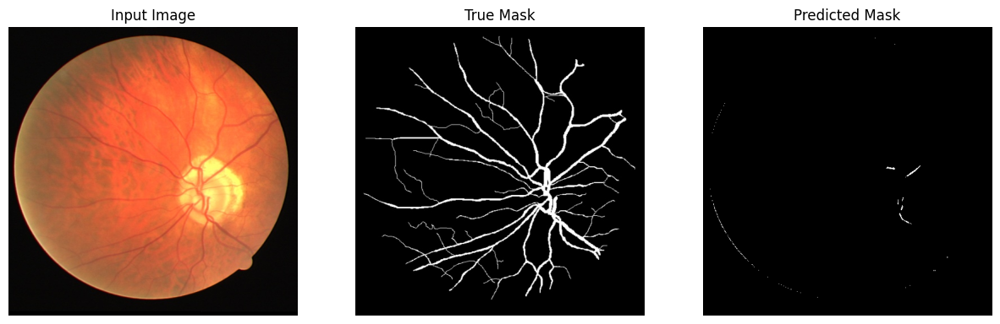


Sample Prediction after epoch 6

54/54 [==============================] - 18s 343ms/step - loss: 0.1638 - accuracy: 0.8066 - val_loss: 0.3318 - val_accuracy: 0.7735 - lr: 1.0000e-04
Epoch 7/100
54/54 [==============================] - 17s 316ms/step - loss: 0.1570 - accuracy: 0.8072 - val_loss: 0.2919 - val_accuracy: 0.7759 - lr: 1.0000e-04
Epoch 8/100
54/54 [==============================] - 17s 317ms/step - loss: 0.1509 - accuracy: 0.8079 - val_loss: 0.2729 - val_accuracy: 0.7784 - lr: 1.0000e-04
Epoch 9/100
54/54 [==============================] - 17s 317ms/step - loss: 0.1458 - accuracy: 0.8085 - val_loss: 0.2436 - val_accuracy: 0.7828 - lr: 1.0000e-04
Epoch 10/100
54/54 [==============================] - 17s 316ms/step - loss: 0.1402 - accuracy: 0.8092 - val_loss: 0.2107 - val_accuracy: 0.7886 - lr: 1.0000e-04
Epoch 11/100
1/1 [==============================] - 0s 24ms/steploss: 0.1369 - accuracy: 0.80


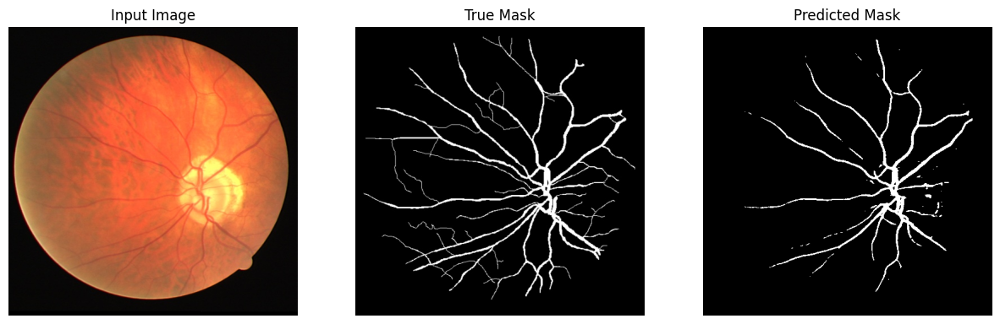


Sample Prediction after epoch 11

54/54 [==============================] - 18s 330ms/step - loss: 0.1369 - accuracy: 0.8094 - val_loss: 0.1872 - val_accuracy: 0.7942 - lr: 1.0000e-04
Epoch 12/100
54/54 [==============================] - 17s 317ms/step - loss: 0.1351 - accuracy: 0.8093 - val_loss: 0.1674 - val_accuracy: 0.7977 - lr: 1.0000e-04
Epoch 13/100
54/54 [==============================] - 17s 323ms/step - loss: 0.1309 - accuracy: 0.8099 - val_loss: 0.1622 - val_accuracy: 0.7983 - lr: 1.0000e-04
Epoch 14/100
54/54 [==============================] - 17s 315ms/step - loss: 0.1272 - accuracy: 0.8104 - val_loss: 0.1511 - val_accuracy: 0.8016 - lr: 1.0000e-04
Epoch 15/100
54/54 [==============================] - 17s 323ms/step - loss: 0.1240 - accuracy: 0.8109 - val_loss: 0.1429 - val_accuracy: 0.8031 - lr: 1.0000e-04
Epoch 16/100
1/1 [==============================] - 0s 23ms/steploss: 0.1209 - accuracy: 0.81


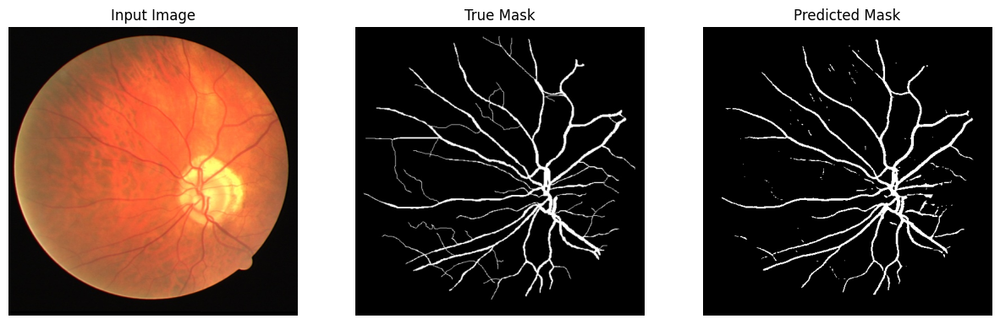


Sample Prediction after epoch 16

54/54 [==============================] - 18s 328ms/step - loss: 0.1209 - accuracy: 0.8113 - val_loss: 0.1401 - val_accuracy: 0.8032 - lr: 1.0000e-04
Epoch 17/100
54/54 [==============================] - 17s 316ms/step - loss: 0.1183 - accuracy: 0.8116 - val_loss: 0.1399 - val_accuracy: 0.8027 - lr: 1.0000e-04
Epoch 18/100
54/54 [==============================] - 17s 313ms/step - loss: 0.1154 - accuracy: 0.8120 - val_loss: 0.1394 - val_accuracy: 0.8029 - lr: 1.0000e-04
Epoch 19/100
54/54 [==============================] - 17s 315ms/step - loss: 0.1119 - accuracy: 0.8125 - val_loss: 0.1383 - val_accuracy: 0.8026 - lr: 1.0000e-04
Epoch 20/100
54/54 [==============================] - 17s 318ms/step - loss: 0.1088 - accuracy: 0.8129 - val_loss: 0.1455 - val_accuracy: 0.8007 - lr: 1.0000e-04
Epoch 21/100
1/1 [==============================] - 0s 22ms/steploss: 0.1066 - accuracy: 0.81


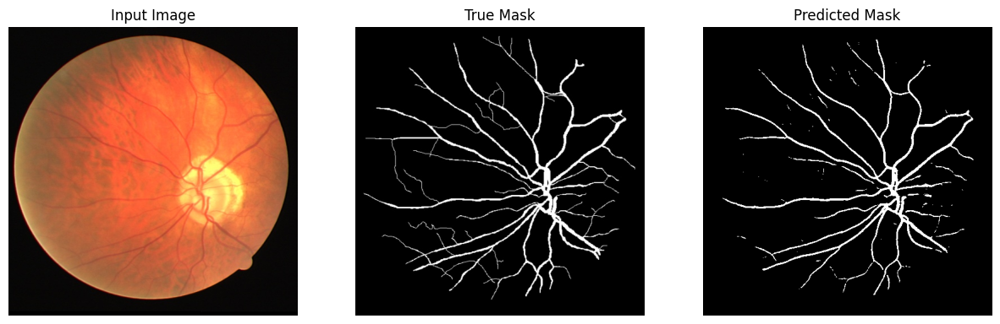


Sample Prediction after epoch 21

54/54 [==============================] - 18s 327ms/step - loss: 0.1066 - accuracy: 0.8130 - val_loss: 0.1417 - val_accuracy: 0.8014 - lr: 1.0000e-04
Epoch 22/100
54/54 [==============================] - 17s 319ms/step - loss: 0.1046 - accuracy: 0.8132 - val_loss: 0.1359 - val_accuracy: 0.8028 - lr: 1.0000e-04
Epoch 23/100
54/54 [==============================] - 17s 316ms/step - loss: 0.1020 - accuracy: 0.8135 - val_loss: 0.1368 - val_accuracy: 0.8026 - lr: 1.0000e-04
Epoch 24/100
54/54 [==============================] - 17s 318ms/step - loss: 0.0996 - accuracy: 0.8137 - val_loss: 0.1392 - val_accuracy: 0.8017 - lr: 1.0000e-04
Epoch 25/100
54/54 [==============================] - 17s 317ms/step - loss: 0.0970 - accuracy: 0.8140 - val_loss: 0.1424 - val_accuracy: 0.8015 - lr: 1.0000e-04
Epoch 26/100
1/1 [==============================] - 0s 24ms/steploss: 0.0945 - accuracy: 0.81


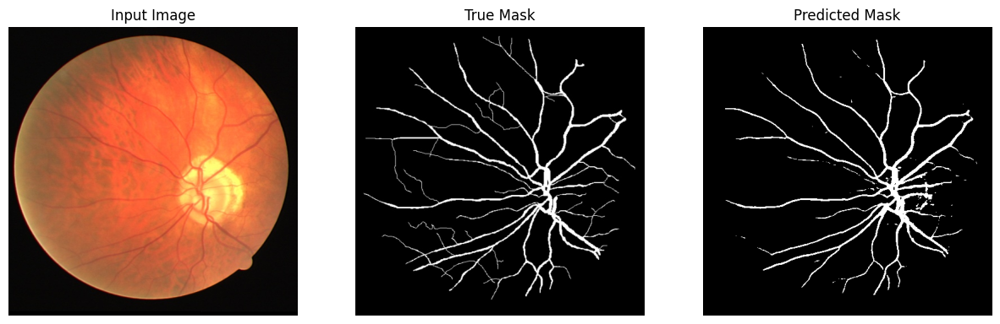


Sample Prediction after epoch 26

54/54 [==============================] - 18s 331ms/step - loss: 0.0945 - accuracy: 0.8143 - val_loss: 0.1397 - val_accuracy: 0.8019 - lr: 1.0000e-04
Epoch 27/100
54/54 [==============================] - 17s 318ms/step - loss: 0.0930 - accuracy: 0.8144 - val_loss: 0.1339 - val_accuracy: 0.8030 - lr: 1.0000e-04
Epoch 28/100
54/54 [==============================] - 17s 318ms/step - loss: 0.0917 - accuracy: 0.8145 - val_loss: 0.1342 - val_accuracy: 0.8025 - lr: 1.0000e-04
Epoch 29/100
54/54 [==============================] - 17s 318ms/step - loss: 0.0900 - accuracy: 0.8147 - val_loss: 0.1378 - val_accuracy: 0.8022 - lr: 1.0000e-04
Epoch 30/100
54/54 [==============================] - 17s 319ms/step - loss: 0.0887 - accuracy: 0.8148 - val_loss: 0.1429 - val_accuracy: 0.8017 - lr: 1.0000e-04
Epoch 31/100
1/1 [==============================] - 0s 24ms/steploss: 0.0869 - accuracy: 0.81


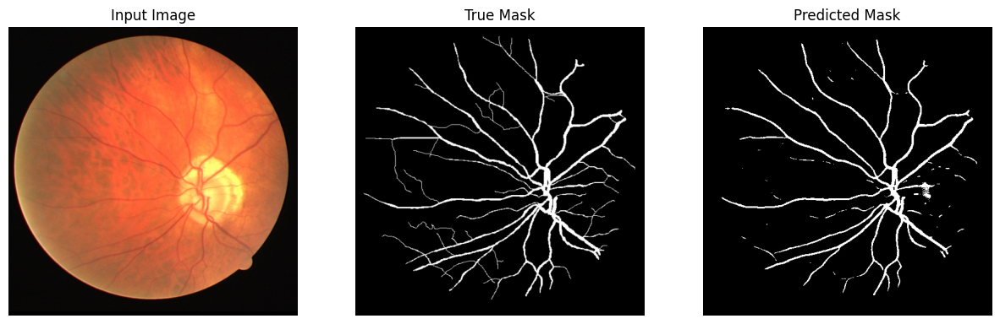


Sample Prediction after epoch 31

54/54 [==============================] - 18s 333ms/step - loss: 0.0869 - accuracy: 0.8149 - val_loss: 0.1427 - val_accuracy: 0.8019 - lr: 1.0000e-04
Epoch 32/100
54/54 [==============================] - ETA: 0s - loss: 0.0853 - accuracy: 0.8151
Epoch 32: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
54/54 [==============================] - 17s 318ms/step - loss: 0.0853 - accuracy: 0.8151 - val_loss: 0.1422 - val_accuracy: 0.8018 - lr: 1.0000e-04
Epoch 33/100
54/54 [==============================] - 17s 324ms/step - loss: 0.0830 - accuracy: 0.8155 - val_loss: 0.1234 - val_accuracy: 0.8045 - lr: 1.0000e-05
Epoch 34/100
54/54 [==============================] - 17s 317ms/step - loss: 0.0786 - accuracy: 0.8162 - val_loss: 0.1249 - val_accuracy: 0.8044 - lr: 1.0000e-05
Epoch 35/100
54/54 [==============================] - 17s 318ms/step - loss: 0.0771 - accuracy: 0.8164 - val_loss: 0.1260 - val_accuracy: 0.8044 - lr: 1.0000e-05
Epoch 36

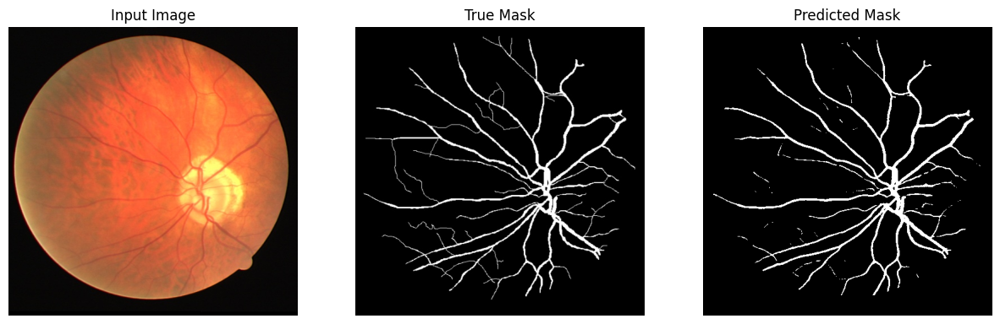


Sample Prediction after epoch 36

54/54 [==============================] - 18s 330ms/step - loss: 0.0760 - accuracy: 0.8166 - val_loss: 0.1270 - val_accuracy: 0.8043 - lr: 1.0000e-05
Epoch 37/100
54/54 [==============================] - 17s 317ms/step - loss: 0.0751 - accuracy: 0.8167 - val_loss: 0.1278 - val_accuracy: 0.8042 - lr: 1.0000e-05
Epoch 38/100
54/54 [==============================] - ETA: 0s - loss: 0.0742 - accuracy: 0.8169
Epoch 38: ReduceLROnPlateau reducing learning rate to 1e-06.
54/54 [==============================] - 17s 318ms/step - loss: 0.0742 - accuracy: 0.8169 - val_loss: 0.1285 - val_accuracy: 0.8042 - lr: 1.0000e-05
Epoch 39/100
54/54 [==============================] - 17s 317ms/step - loss: 0.0735 - accuracy: 0.8169 - val_loss: 0.1283 - val_accuracy: 0.8042 - lr: 1.0000e-06
Epoch 40/100
54/54 [==============================] - 17s 318ms/step - loss: 0.0733 - accuracy: 0.8170 - val_loss: 0.1286 - val_accuracy: 0.8042 - lr: 1.0000e-06
Epoch 41/100
1/1 [======

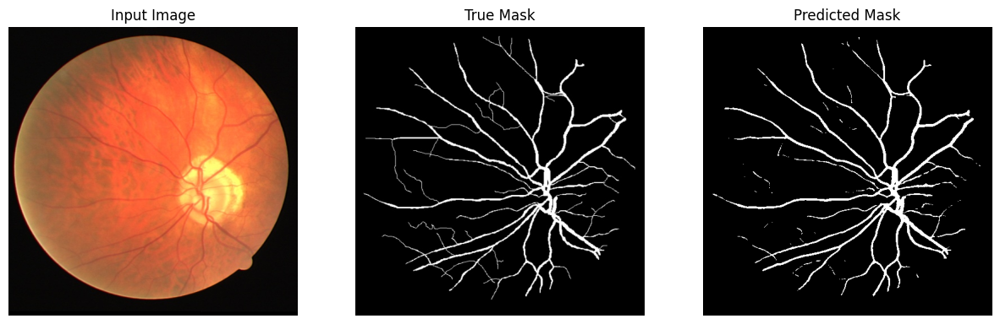


Sample Prediction after epoch 41

54/54 [==============================] - 18s 328ms/step - loss: 0.0732 - accuracy: 0.8170 - val_loss: 0.1287 - val_accuracy: 0.8042 - lr: 1.0000e-06
Epoch 42/100
54/54 [==============================] - 17s 321ms/step - loss: 0.0731 - accuracy: 0.8170 - val_loss: 0.1289 - val_accuracy: 0.8042 - lr: 1.0000e-06
Epoch 43/100
54/54 [==============================] - 17s 316ms/step - loss: 0.0730 - accuracy: 0.8170 - val_loss: 0.1290 - val_accuracy: 0.8042 - lr: 1.0000e-06
Epoch 44/100
54/54 [==============================] - 17s 315ms/step - loss: 0.0729 - accuracy: 0.8170 - val_loss: 0.1290 - val_accuracy: 0.8042 - lr: 1.0000e-06
Epoch 45/100
54/54 [==============================] - 17s 316ms/step - loss: 0.0729 - accuracy: 0.8171 - val_loss: 0.1291 - val_accuracy: 0.8042 - lr: 1.0000e-06
Epoch 46/100
1/1 [==============================] - 0s 23ms/steploss: 0.0728 - accuracy: 0.81


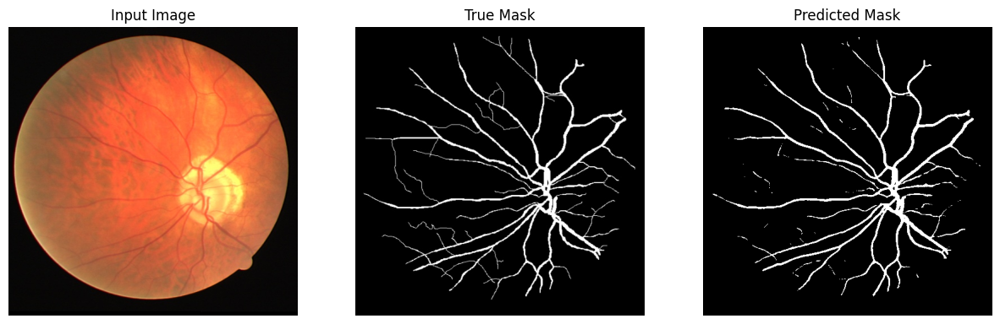


Sample Prediction after epoch 46

54/54 [==============================] - 18s 327ms/step - loss: 0.0728 - accuracy: 0.8171 - val_loss: 0.1292 - val_accuracy: 0.8042 - lr: 1.0000e-06
Epoch 47/100
54/54 [==============================] - 17s 320ms/step - loss: 0.0727 - accuracy: 0.8171 - val_loss: 0.1293 - val_accuracy: 0.8042 - lr: 1.0000e-06
Epoch 48/100
54/54 [==============================] - 17s 316ms/step - loss: 0.0726 - accuracy: 0.8171 - val_loss: 0.1294 - val_accuracy: 0.8041 - lr: 1.0000e-06
Epoch 49/100
54/54 [==============================] - 17s 320ms/step - loss: 0.0726 - accuracy: 0.8171 - val_loss: 0.1295 - val_accuracy: 0.8041 - lr: 1.0000e-06
Epoch 50/100
54/54 [==============================] - 17s 318ms/step - loss: 0.0725 - accuracy: 0.8171 - val_loss: 0.1296 - val_accuracy: 0.8041 - lr: 1.0000e-06
Epoch 51/100
1/1 [==============================] - 0s 27ms/steploss: 0.0724 - accuracy: 0.81


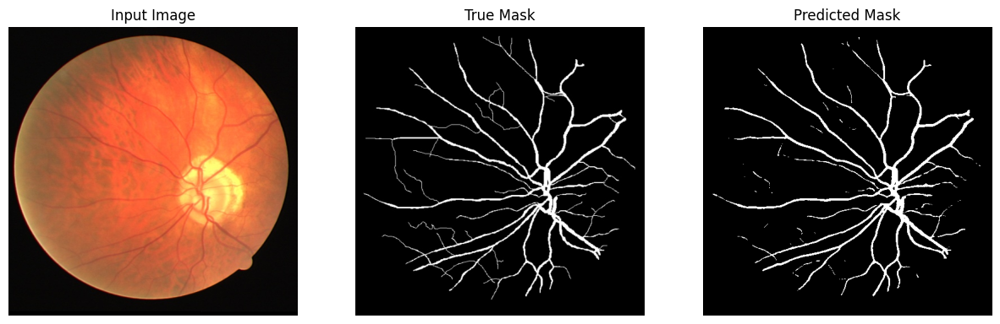


Sample Prediction after epoch 51

54/54 [==============================] - 18s 333ms/step - loss: 0.0724 - accuracy: 0.8171 - val_loss: 0.1296 - val_accuracy: 0.8041 - lr: 1.0000e-06
Epoch 52/100
54/54 [==============================] - 17s 317ms/step - loss: 0.0723 - accuracy: 0.8171 - val_loss: 0.1297 - val_accuracy: 0.8041 - lr: 1.0000e-06
Epoch 53/100
54/54 [==============================] - 17s 319ms/step - loss: 0.0722 - accuracy: 0.8171 - val_loss: 0.1298 - val_accuracy: 0.8041 - lr: 1.0000e-06


In [14]:

model = build_unet((H, W, 3))
model.compile(loss=BCE(), optimizer=Adam(lr), metrics=[ "accuracy" ])
# model.summary()


callbacks = [
#     ModelCheckpoint(model_path, verbose=1, save_best_only=True),
    ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=5, min_lr=1e-6, verbose=1),
    CSVLogger(csv_path),
    TensorBoard(log_dir=log_dir, histogram_freq=1),
    EarlyStopping(monitor="val_loss", patience=20, restore_best_weights=False),
    DisplayCallback(train_dataset)
]

model.fit(
    train_dataset,
    epochs=num_epochs,
    validation_data=valid_dataset,
    steps_per_epoch=train_steps,
    validation_steps=valid_steps,
    callbacks=callbacks
)

In [15]:
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score,roc_auc_score
def read_image(path):
    x = cv2.imread(path, cv2.IMREAD_COLOR)
    x = x/255.0
    x = x.astype(np.float32)
    return x

def read_mask(path):
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  ## (512, 512)
    x = x/255.0
    x = x.astype(np.float32)
    x = np.expand_dims(x, axis=-1)              ## (512, 512, 1)
    return x

def save_results(ori_x, ori_y, y_pred, save_image_path):
    line = np.ones((H, 10, 3)) * 255

    ori_y = np.expand_dims(ori_y, axis=-1)
    ori_y = np.concatenate([ori_y, ori_y, ori_y], axis=-1)

    y_pred = np.expand_dims(y_pred, axis=-1)
    y_pred = np.concatenate([y_pred, y_pred, y_pred], axis=-1) * 255
    
    cat_images = np.concatenate([ori_x, line, ori_y, line, y_pred], axis=1)
    
    cv2.imwrite(save_image_path, cat_images)
    
def print_results(x,y,y_pred):
    fig,ax = plt.subplots(1,3,figsize=(15,15))
    ax[0].imshow(cv2.cvtColor(x, cv2.COLOR_BGR2RGB))
    ax[0].set_title('Original Image')
    ax[1].imshow(cv2.cvtColor(y, cv2.COLOR_BGR2RGB))
    ax[1].set_title('Ground Truth')
#     ax[2].imshow(cv2.cvtColor(y_pred, cv2.COLOR_BGR2RGB))
    ax[2].imshow(y_pred, cmap='gray')    
    ax[2].set_title('Predicted Image')
    plt.axis('off')
    plt.show()
    return

create_dir("results")

  0%|          | 0/20 [00:00<?, ?it/s]

1/1 [==============================] - 2s 2s/step


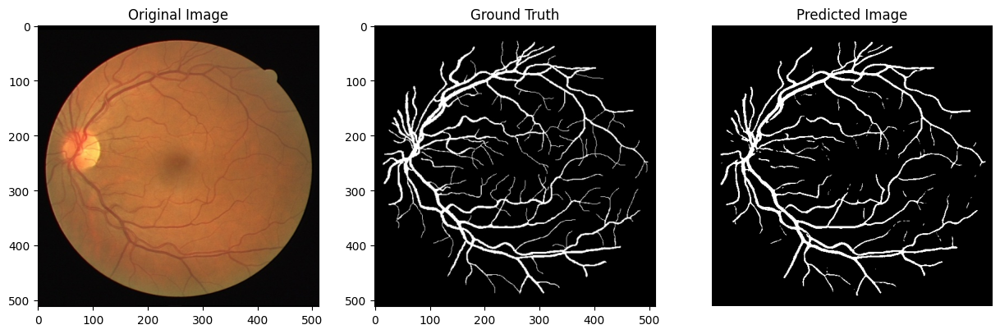

  5%|▌         | 1/20 [00:02<00:55,  2.91s/it]

1/1 [==============================] - 0s 23ms/step


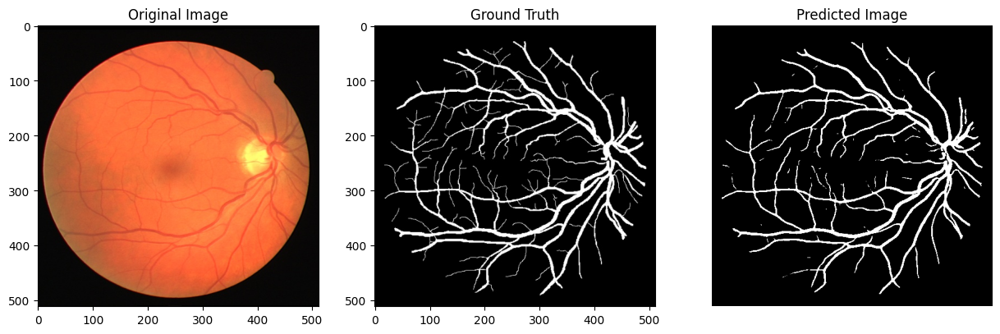

 10%|█         | 2/20 [00:04<00:35,  1.95s/it]

1/1 [==============================] - 0s 22ms/step


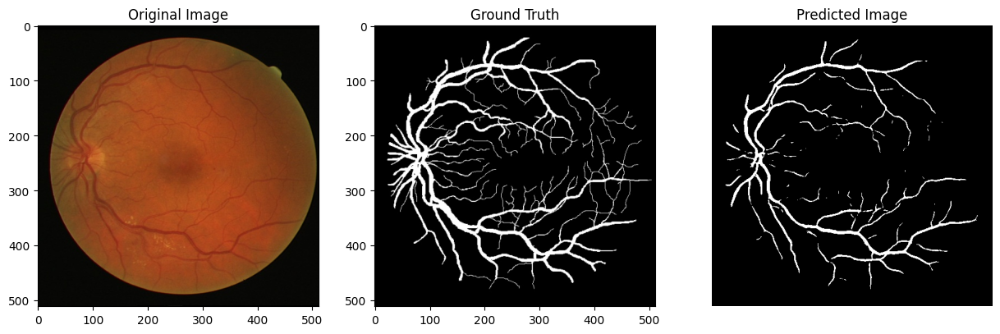

 15%|█▌        | 3/20 [00:05<00:27,  1.63s/it]

1/1 [==============================] - 0s 22ms/step


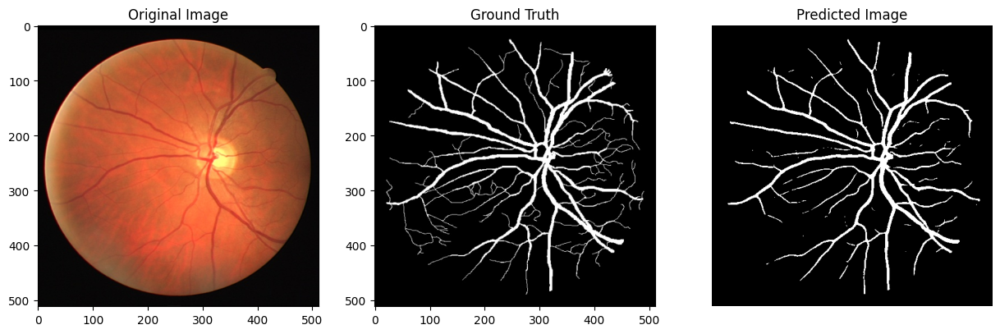

 20%|██        | 4/20 [00:06<00:23,  1.46s/it]

1/1 [==============================] - 0s 21ms/step


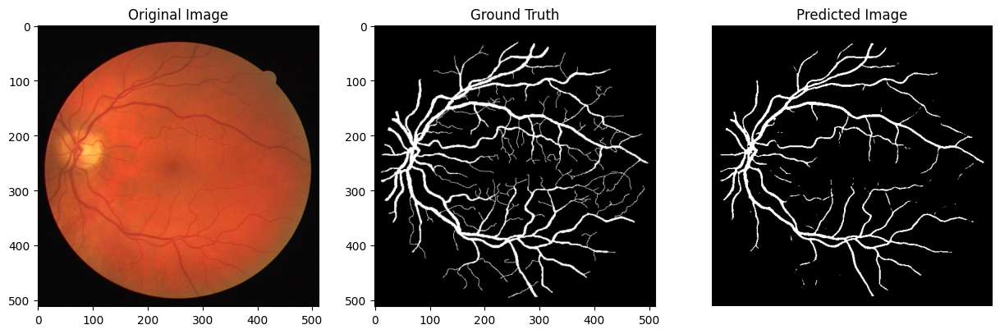

 25%|██▌       | 5/20 [00:08<00:22,  1.48s/it]

1/1 [==============================] - 0s 24ms/step


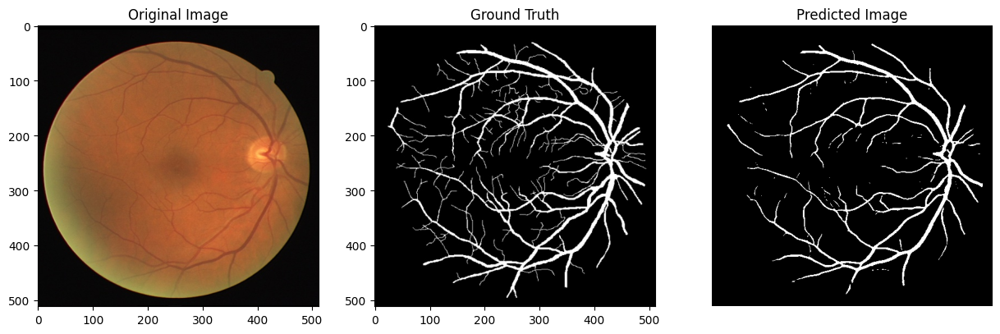

 30%|███       | 6/20 [00:09<00:19,  1.40s/it]

1/1 [==============================] - 0s 23ms/step


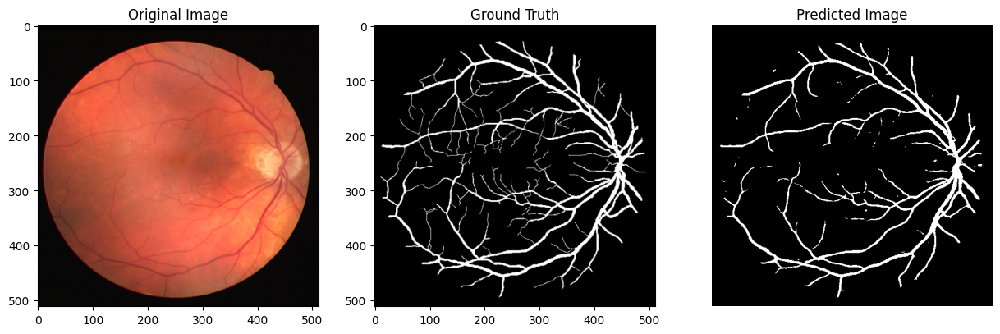

 35%|███▌      | 7/20 [00:10<00:17,  1.37s/it]

1/1 [==============================] - 0s 23ms/step


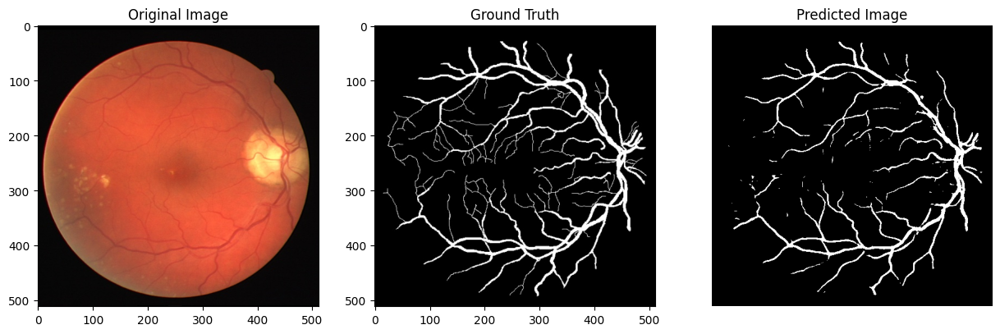

 40%|████      | 8/20 [00:11<00:15,  1.32s/it]

1/1 [==============================] - 0s 22ms/step


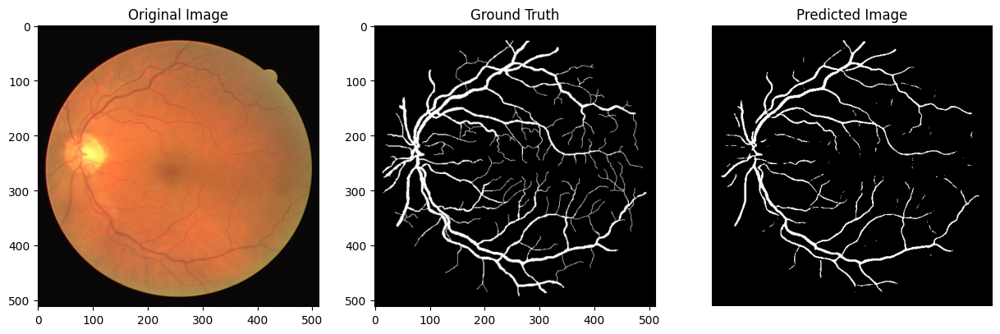

 45%|████▌     | 9/20 [00:13<00:14,  1.28s/it]

1/1 [==============================] - 0s 22ms/step


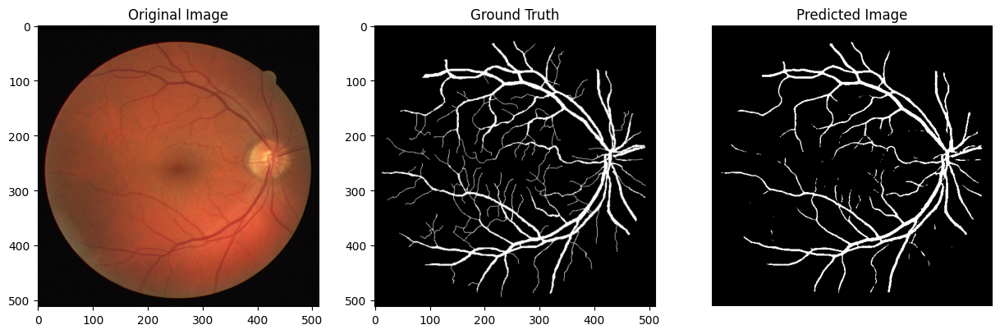

 50%|█████     | 10/20 [00:14<00:12,  1.28s/it]

1/1 [==============================] - 0s 22ms/step


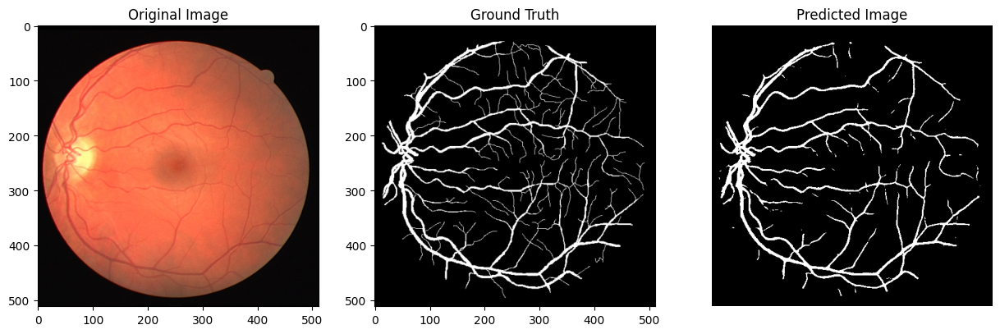

 55%|█████▌    | 11/20 [00:15<00:11,  1.26s/it]

1/1 [==============================] - 0s 21ms/step


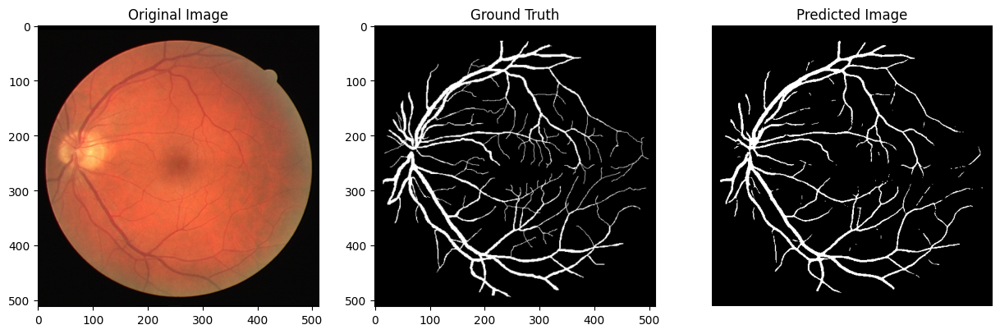

 60%|██████    | 12/20 [00:16<00:10,  1.27s/it]

1/1 [==============================] - 0s 21ms/step


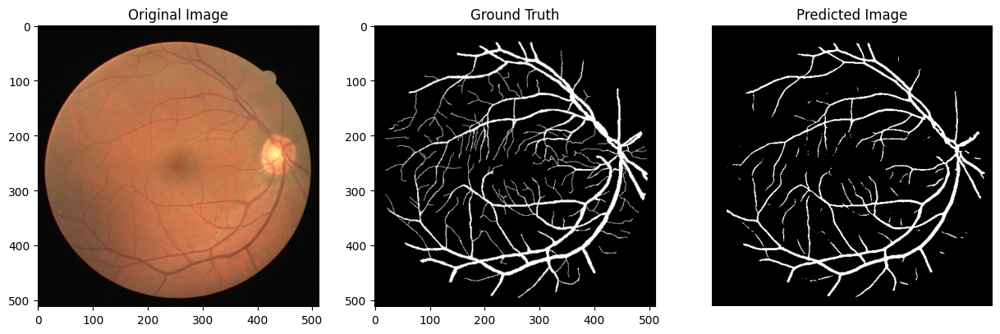

 65%|██████▌   | 13/20 [00:18<00:08,  1.27s/it]

1/1 [==============================] - 0s 21ms/step


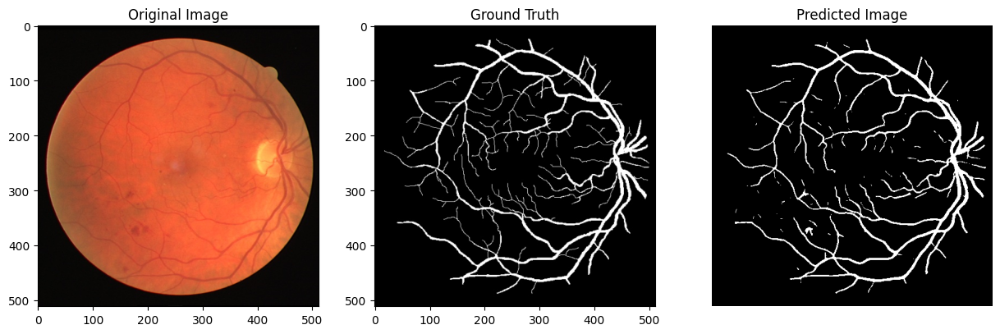

 70%|███████   | 14/20 [00:19<00:07,  1.25s/it]

1/1 [==============================] - 0s 22ms/step


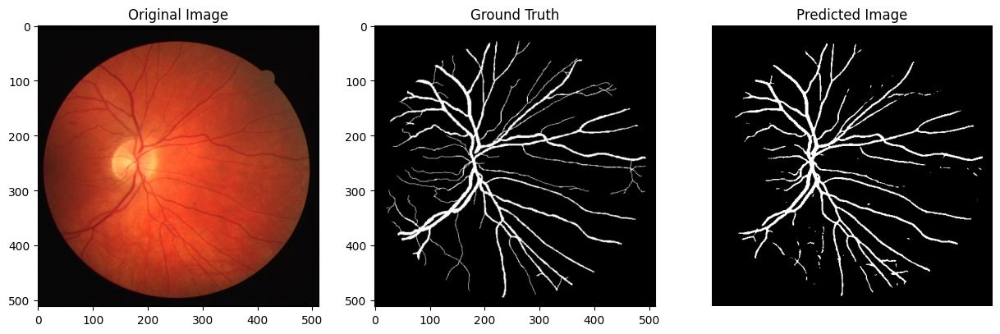

 75%|███████▌  | 15/20 [00:20<00:06,  1.26s/it]

1/1 [==============================] - 0s 23ms/step


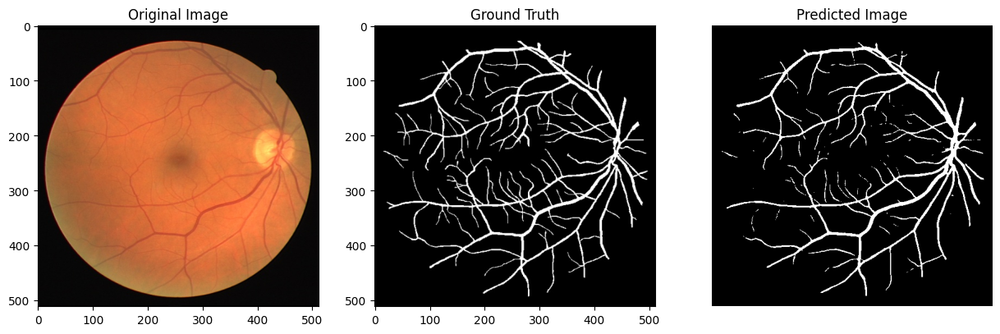

 80%|████████  | 16/20 [00:21<00:04,  1.25s/it]

1/1 [==============================] - 0s 22ms/step


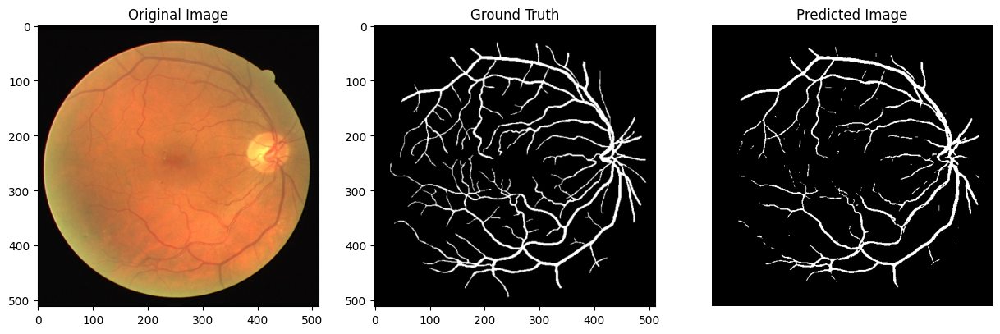

 85%|████████▌ | 17/20 [00:23<00:03,  1.25s/it]

1/1 [==============================] - 0s 21ms/step


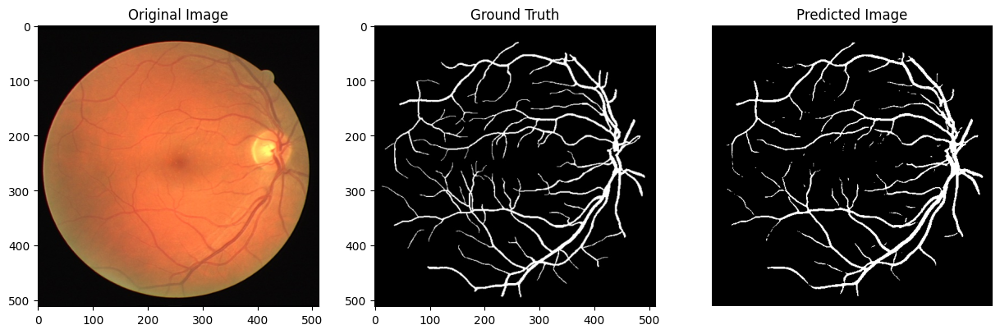

 90%|█████████ | 18/20 [00:24<00:02,  1.23s/it]

1/1 [==============================] - 0s 21ms/step


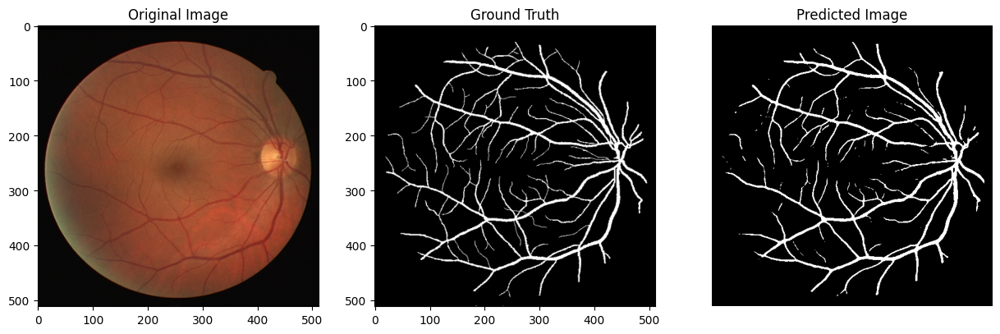

 95%|█████████▌| 19/20 [00:25<00:01,  1.22s/it]

1/1 [==============================] - 0s 21ms/step


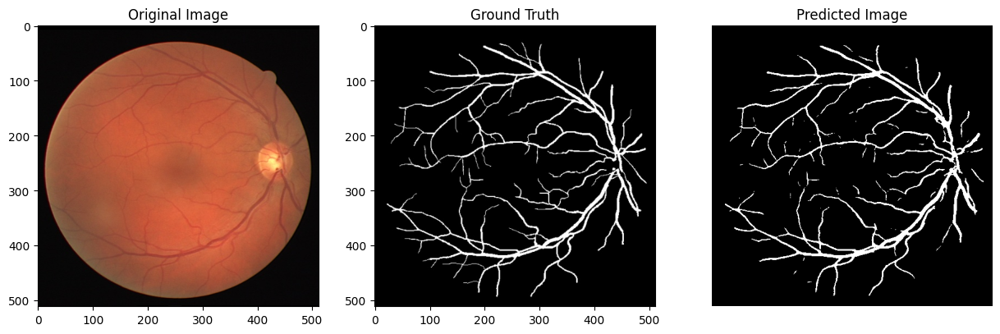

100%|██████████| 20/20 [00:26<00:00,  1.34s/it]

Accuracy: 0.95250
F1: 0.55086
Jaccard: 0.38079
Recall: 0.86848
Precision: 0.40771
AUC: 0.91201


In [16]:
""" Make the prediction and calculate the metrics values """
SCORE = []
for x, y in tqdm(zip(test_x, test_y), total=len(test_x)):
    """ Extracting name """
    name = x.split("/")[-1].split(".")[0]

    """ Read the image and mask """
    x = read_image(x)
    y = read_mask(y)

    """ Prediction """
    y_pred = model.predict(np.expand_dims(x, axis=0))[0]
    y_pred = y_pred > 0.5
    y_pred = y_pred.astype(np.int32)
    y = np.squeeze(y, axis=-1)
    y_pred = np.squeeze(y_pred, axis=-1)

    save_image_path = f"results/{name}.png"
    save_results(x, y, y_pred, save_image_path)
    
    print_results(x,y,y_pred)   
    
    """ Flatten the array """
    y = y.astype(np.int32)
    y = y.flatten()
    y_pred = y_pred.flatten()

    """ Calculate the metrics """
    acc_value = accuracy_score(y, y_pred)
    f1_value = f1_score(y, y_pred, labels=[0, 1], average="binary")
    jac_value = jaccard_score(y, y_pred, labels=[0, 1], average="binary")
    recall_value = recall_score(y, y_pred, labels=[0, 1], average="binary")
    precision_value = precision_score(y, y_pred, labels=[0, 1], average="binary")
    auc = roc_auc_score(y, y_pred)
    SCORE.append([name, acc_value, f1_value, jac_value, recall_value, precision_value,auc])

score = [s[1:] for s in SCORE]
score = np.mean(score, axis=0)

print(f"Accuracy: {score[0]:0.5f}")
print(f"F1: {score[1]:0.5f}")
print(f"Jaccard: {score[2]:0.5f}")
print(f"Recall: {score[3]:0.5f}")
print(f"Precision: {score[4]:0.5f}")
print(f"AUC: {score[5]:0.5f}")
